In [1]:
from __future__ import division

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
%matplotlib inline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score


/Users/alnick06/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [2]:
bb = pd.read_csv('realestate train.csv',encoding='Latin-1')
bb

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


**Importing the data I realized upfront the I was going to need to dummy the string columns. There's nothing I can computationally do with them so they need to be converted into integers.**

In [3]:
pd.options.display.max_rows=1460
pd.options.display.max_columns=83

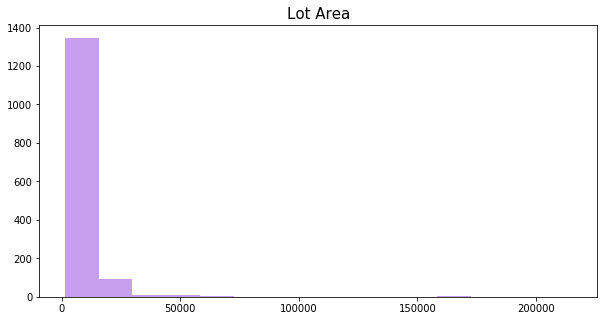

In [4]:
fig = plt.figure(figsize=(10,5))
plt.hist(bb['LotArea'],bins=15, color="#c79fef")
plt.title('Lot Area',fontsize=15)
plt.show()

**This portion of my thought process I was try to get a visual on some of the columns like the size of the land the house is on and the price the house itself.**

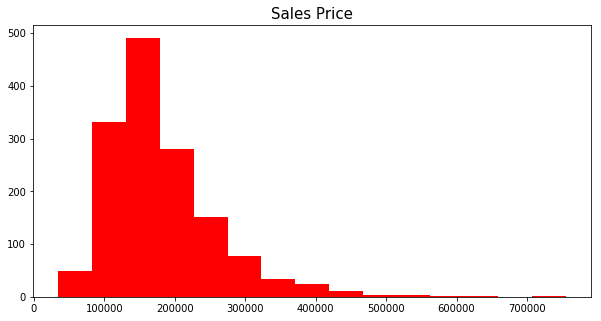

In [5]:
fig = plt.figure(figsize=(10,5))
plt.hist(bb['SalePrice'],bins=15, color="r")
plt.title('Sales Price',fontsize=15)
plt.show()

**Between the histogram graph and the scatter plots I noticed there was a few outliers in the sales price and the size of the lot. I also I noticed the obvious where for the most part the larger the lot size the more the house was worth.**

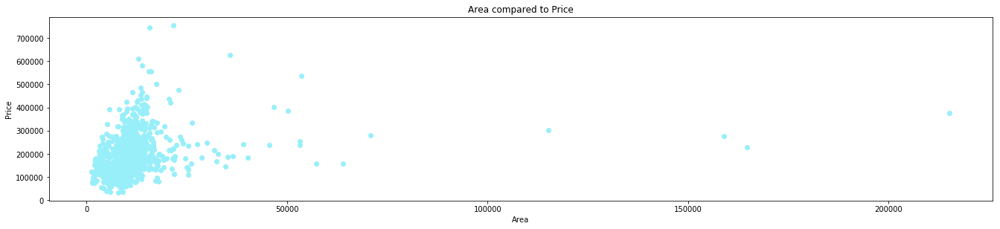

In [6]:

fig =plt.figure(figsize=(50,10))
ax1 = fig.add_subplot(2,2,1)
bins=(0)
ax1.scatter(bb["LotArea"], bb["SalePrice"],c="#98eff9")
ax1.set_xlabel("Area")
ax1.set_ylabel("Price")
ax1.set_title("Area compared to Price")
ax1.grid(False)

In [7]:
bb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

**This was used to get a feel for a overview of what I was looking at in the dataframe and specific columns to give a second look at**

In [8]:
bb.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

**I needed to know all the column names as well as what features for the homes were going to be in the data set.**

In [9]:
bb["Neighborhood"].value_counts()

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

**This was a way to see how many houses were sold in each neighborhood and for how much money they were sold for.**

In [10]:
bb[bb["Neighborhood"]=="NAmes"]["SalePrice"]

14      157000
16      149000
19      139000
26      134800
28      207500
33      165500
37      153000
38      109000
40      160000
44      141000
54      130000
55      180500
66      180000
70      244000
73      144900
76      135750
80      193500
83      126500
90      109900
91       98600
99      128950
122     136000
128     155000
129     150000
130     226000
132     150750
136     143000
140     115000
142     166000
156     109500
171     215000
173     163000
191     184000
197     235000
207     141000
209     145000
215     134450
223      97000
230     148000
247     140000
253     158000
254     145000
260     176000
273     139000
286     159000
287      88000
294     167000
311     132000
324     242000
327     145250
330     119000
331     139000
339     155000
342      87500
346     151500
347     157500
366     159000
367     165000
368     132000
369     162000
373     123000
392     106500
397     169500
419     142000
424     139000
427     109008
446     19

In [11]:
bb[bb["Neighborhood"]=="NAmes"]["SalePrice"].mean()

145847.08

In [12]:
bb[bb["Neighborhood"]=="NAmes"]["SalePrice"].min()

87500

In [13]:
bb[bb["Neighborhood"]=="NAmes"]["SalePrice"].max()

345000

**This was to see the range bewteen the highest and the lowest price.**

In [14]:
bb['SalePrice'].describe()    

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

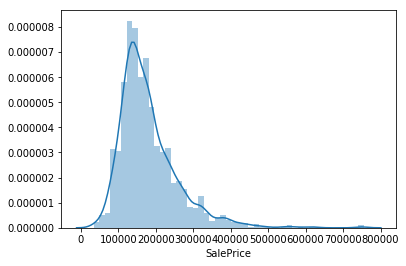

In [15]:
sns.distplot(bb['SalePrice'])

**The distrubution plot showed me what price range was popular to buy a house and it further showed me that there a small subsection of homes being sold for a lot more than the mean sales price.**

In [16]:
re=('Lot.Area','Utilities','Neighborhood','Bldg.Type','House.Style','Overall.Qual','Overall.Cond','Year.Built','Year.Remod.Add','Roof.Style','Roof.Matl','Gr.Liv.Area','Full.Bath','Half.Bath','Bedroom.AbvGr','Kitchen.AbvGr','Mo.Sold','Yr.Sold','SalePrice')

In [17]:
bb.drop(['Street','Alley','MSSubClass','MSZoning','LotShape','LandContour','Utilities','LotConfig','LandSlope','Condition1','Condition2','KitchenQual','TotRmsAbvGrd','Functional','Fireplaces','FireplaceQu', 'GarageType','GarageYrBlt', 'GarageFinish','GarageCars','GarageArea','GarageQual','GarageCond','PavedDrive','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','PoolQC','Fence','MiscFeature'],axis=1,inplace=True)

In [18]:
bb

,Id,LotFrontage,LotArea,Neighborhood,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,65.0,8450,CollgCr,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,0,2,2008,WD,Normal,208500
1,2,80.0,9600,Veenker,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,0,5,2007,WD,Normal,181500
2,3,68.0,11250,CollgCr,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,0,9,2008,WD,Normal,223500
3,4,60.0,9550,Crawfor,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,0,2,2006,WD,Abnorml,140000
4,5,84.0,14260,NoRidge,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,0,12,2008,WD,Normal,250000
5,6,85.0,14115,Mitchel,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,700,10,2009,WD,Normal,143000
6,7,75.0,10084,Somerst,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,0,8,2007,WD,Normal,307000
7,8,NaN,10382,NWAmes,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,350,11,2009,WD,Normal,200000
8,9,51.0,6120,OldTown,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,0,4,2008,WD,Abnorml,129900
9,10,50.0,7420,BrkSide,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,0,1,2008,WD,Normal,118000


**Taking the original data frame and slicing it down to the constraints of the project rubric**

In [19]:

def replace_nulls(value):
    if value == 'NaN':
        return np.nan
    else:
        return value

In [20]:
bb['Mean Price']=bb[bb["Neighborhood"]=="NAmes"]["SalePrice"].mean()

**Added a new column of the mean of the sales price of all of the homes.**

In [21]:
bb.head(10)

,Id,LotFrontage,LotArea,Neighborhood,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Mean Price
0,1,65.0,8450,CollgCr,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,0,2,2008,WD,Normal,208500,145847.08
1,2,80.0,9600,Veenker,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,0,5,2007,WD,Normal,181500,145847.08
2,3,68.0,11250,CollgCr,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,0,9,2008,WD,Normal,223500,145847.08
3,4,60.0,9550,Crawfor,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,0,2,2006,WD,Abnorml,140000,145847.08
4,5,84.0,14260,NoRidge,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,0,12,2008,WD,Normal,250000,145847.08
5,6,85.0,14115,Mitchel,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,700,10,2009,WD,Normal,143000,145847.08
6,7,75.0,10084,Somerst,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,0,8,2007,WD,Normal,307000,145847.08
7,8,NaN,10382,NWAmes,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,350,11,2009,WD,Normal,200000,145847.08
8,9,51.0,6120,OldTown,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,0,4,2008,WD,Abnorml,129900,145847.08
9,10,50.0,7420,BrkSide,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,0,1,0,2,2,0,1,2008,WD,Normal,118000,145847.08


In [22]:
bb.describe()

,Id,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,MiscVal,MoSold,YrSold,SalePrice,Mean Price
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1.460000e+03
mean,730.500000,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,43.489041,6.321918,2007.815753,180921.195890,1.458471e+05
std,421.610009,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,496.123024,2.703626,1.328095,79442.502883,3.872136e-09
min,1.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000,1.458471e+05
25%,365.750000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,0.000000,5.000000,2007.000000,129975.000000,1.458471e+05
50%,730.500000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,0.000000,6.000000,2008.000000,163000.000000,1.458471e+05
75%,1095.250000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,0.000000,8.000000,2009.000000,214000.000000,1.458471e+05
max,1460.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,15500.000000,12.000000,2010.000000,755000.000000,1.458471e+05


**Describing the data frame showing the standard deviation, mean, maximium and mininum values in each column**

In [23]:
bb.dropna(axis=1)

,Id,LotArea,Neighborhood,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Mean Price
0,1,8450,CollgCr,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,706,0,150,856,GasA,Ex,Y,856,854,0,1710,1,0,2,1,3,1,0,2,2008,WD,Normal,208500,145847.08
1,2,9600,Veenker,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,TA,TA,CBlock,978,0,284,1262,GasA,Ex,Y,1262,0,0,1262,0,1,2,0,3,1,0,5,2007,WD,Normal,181500,145847.08
2,3,11250,CollgCr,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,486,0,434,920,GasA,Ex,Y,920,866,0,1786,1,0,2,1,3,1,0,9,2008,WD,Normal,223500,145847.08
3,4,9550,Crawfor,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,TA,TA,BrkTil,216,0,540,756,GasA,Gd,Y,961,756,0,1717,1,0,1,0,3,1,0,2,2006,WD,Abnorml,140000,145847.08
4,5,14260,NoRidge,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,655,0,490,1145,GasA,Ex,Y,1145,1053,0,2198,1,0,2,1,4,1,0,12,2008,WD,Normal,250000,145847.08
5,6,14115,Mitchel,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,TA,TA,Wood,732,0,64,796,GasA,Ex,Y,796,566,0,1362,1,0,1,1,1,1,700,10,2009,WD,Normal,143000,145847.08
6,7,10084,Somerst,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Gd,TA,PConc,1369,0,317,1686,GasA,Ex,Y,1694,0,0,1694,1,0,2,0,3,1,0,8,2007,WD,Normal,307000,145847.08
7,8,10382,NWAmes,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,TA,TA,CBlock,859,32,216,1107,GasA,Ex,Y,1107,983,0,2090,1,0,2,1,3,1,350,11,2009,WD,Normal,200000,145847.08
8,9,6120,OldTown,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,TA,TA,BrkTil,0,0,952,952,GasA,Gd,Y,1022,752,0,1774,0,0,2,0,2,2,0,4,2008,WD,Abnorml,129900,145847.08
9,10,7420,BrkSide,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,TA,TA,BrkTil,851,0,140,991,GasA,Ex,Y,1077,0,0,1077,1,0,1,0,2,2,0,1,2008,WD,Normal,118000,145847.08


In [24]:
string_columns=bb.select_dtypes(include=object)
integer_columns=bb.select_dtypes(include=int)


In [25]:
string_columns1=pd.get_dummies(string_columns)

In [26]:
bb2=pd.concat([integer_columns, string_columns1], axis=1, ignore_index=False)

**Here I sliced all the strings and the integers from the original data frame. Then I made the strings able to use for computations and visualization so I dummied the columns. After getting new columns with ones and zeroes I concated the dataframes, the updated dummied strings and the integer columns, and created a new mathmatically ready dataframe.

In [27]:
bb2

,Id,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,MiscVal,MoSold,YrSold,SalePrice,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,...,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,8450,7,5,2003,2003,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,0,2,2008,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
1,2,9600,6,8,1976,1976,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,0,5,2007,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
2,3,11250,7,5,2001,2002,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,0,9,2008,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
3,4,9550,7,5,1915,1970,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,0,2,2006,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
4,5,14260,8,5,2000,2000,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,0,12,2008,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
5,6,14115,5,5,1993,1995,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,700,10,2009,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
6,7,10084,8,5,2004,2005,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,0,8,2007,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
7,8,10382,7,6,1973,1973,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,350,11,2009,200000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
8,9,6120,7,5,1931,1950,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,0,4,2008,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
9,10,7420,5,6,1939,1950,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,0,1,2008,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


In [28]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
lr = linear_model.LinearRegression()

for x in string_columns1:
    pd.value_counts
print(x)

from string import ascii_letters

SaleCondition_Partial


**I created a heatmap of the entire data frame and there was no was to see small details and relationships in the data so I used the previous two data frames before I concated them and I heat mapped both of them to see if there was any stand out correlations that I should take note of.**

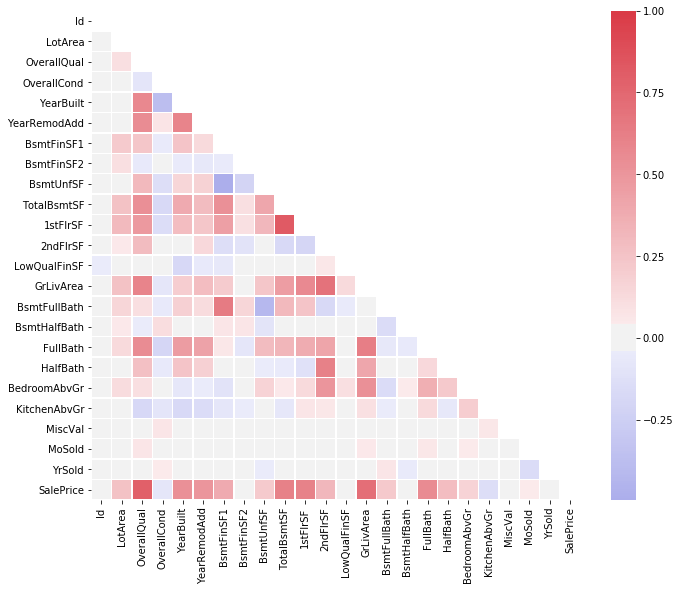

In [29]:
corr = integer_columns.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(265, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5)

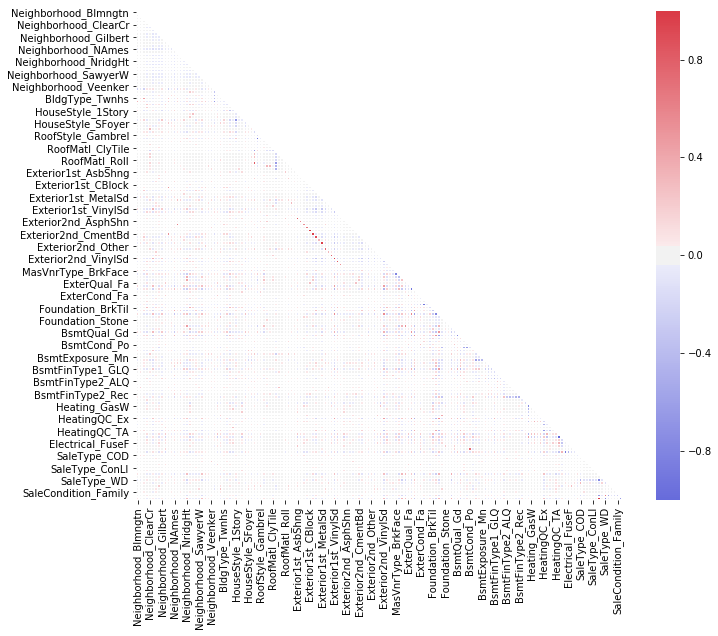

In [30]:
corr = string_columns1.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(265, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5)

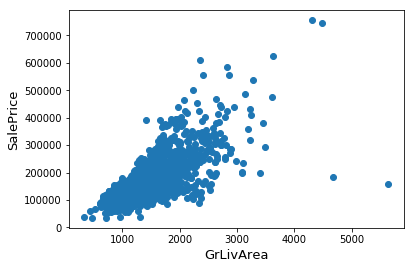

In [31]:
fig, ax = plt.subplots()
ax.scatter(x = bb2['GrLivArea'], y = bb2['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('GrLivArea', fontsize=13)
plt.show()

**I took two different features gross living area and overall quality and made some scatter plots to show the relationships between them and the sales prices. Gross Living area showed a pretty strong linear relationship and I could see just a couple outliers in the bunch. As for overall quality as the quality went up so did the sales price. This shows a positive correlation between the two features.**

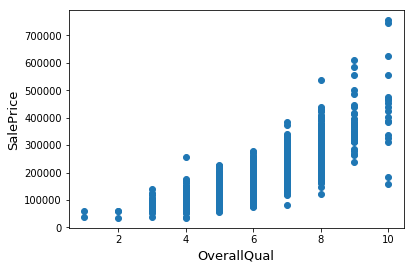

In [32]:
fig, ax = plt.subplots()
ax.scatter(x = bb2['OverallQual'], y = bb2['SalePrice'])
plt.ylabel('SalePrice', fontsize=13)
plt.xlabel('OverallQual', fontsize=13)
plt.show()

**Here is where I started to test taking different data frames and testing to what I got for a cross validation score.** 

In [33]:
X=integer_columns.drop(['SalePrice'],axis=1)
y=bb2['SalePrice']

In [34]:
cross_val_score(lr,X,y)

array([0.83968778, 0.77833488, 0.67805014])

In [35]:
cross_val_score(lr,X,y).mean()

0.7653575993121468

In [36]:
y.shape

(1460,)

In [37]:
new_df=integer_columns.drop('MoSold',axis=1)

In [38]:
X=new_df.drop(['SalePrice'],axis=1)
y=new_df['SalePrice']

In [39]:
cross_val_score(lr,X,y)

array([0.83994309, 0.78217868, 0.68169856])

In [40]:
bb2=bb2.drop(['MoSold'],axis=1)

In [41]:
bb4=bb2.drop(bb2[(bb2['GrLivArea']>4000)&(bb2['SalePrice']<300000)].index)

**I decided to take the whole dataframe and start from scratch. Using the heatmap I took out the month sold column and deleted some of the outliers in the gross living area and sales price columns.**

In [42]:
bb4['LotArea'].max()

215245

**I tried to see what the highest number was in lot size and compared it with the rest of the column to see if it belonged or if it was an outlier and I could purge it. I felt the need to get rid of it but it ended up ultimately bringing down my r2 score so I left it in.** 

In [43]:
bb4

,Id,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,MiscVal,YrSold,SalePrice,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,...,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,8450,7,5,2003,2003,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,0,2008,208500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
1,2,9600,6,8,1976,1976,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,0,2007,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
2,3,11250,7,5,2001,2002,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,0,2008,223500,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
3,4,9550,7,5,1915,1970,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,0,2006,140000,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
4,5,14260,8,5,2000,2000,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,0,2008,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
5,6,14115,5,5,1993,1995,732,0,64,796,796,566,0,1362,1,0,1,1,1,1,700,2009,143000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
6,7,10084,8,5,2004,2005,1369,0,317,1686,1694,0,0,1694,1,0,2,0,3,1,0,2007,307000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
7,8,10382,7,6,1973,1973,859,32,216,1107,1107,983,0,2090,1,0,2,1,3,1,350,2009,200000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
8,9,6120,7,5,1931,1950,0,0,952,952,1022,752,0,1774,0,0,2,0,2,2,0,2008,129900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
9,10,7420,5,6,1939,1950,851,0,140,991,1077,0,0,1077,1,0,1,0,2,2,0,2008,118000,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


**([0.83968778, 0.77833488, 0.67805014])
([0.79629048, 0.74439478, 0.67570378])
([0.81289026, 0.75377453, 0.6934925 ])
[0.83117724, 0.76783821, 0.69917991])
([0.83141666, 0.77404799, 0.70330164])
([0.82751922, 0.82420643, 0.80937968]) after doing outlier cleaning
**Keeping tally after my testing to see my progress.**

**I created a custom dataframe full of columns that I thought were important after looking at my visualizations** 

In [44]:
X=bb4[['LotArea','1stFlrSF','2ndFlrSF','OverallQual','OverallCond','GrLivArea','YrSold','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','MiscVal','YearBuilt','YearRemodAdd','YearBuilt','KitchenAbvGr']]
y=bb4['SalePrice']

**After creating another,you guessed it, heatmap! I picked out the features that had the highest levels of correlation to sales price according to the heatmap and proceeded to trim the fat from my custom data frame thereby creating a new data frame.**

In [ ]:
hm1=bb4[['LotArea','1stFlrSF','2ndFlrSF','OverallQual','OverallCond','GrLivArea','BsmtFullBath','FullBath','HalfBath','YearBuilt','YearRemodAdd','YearBuilt','KitchenAbvGr','SalePrice']]

In [45]:
corr = hm1.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(265, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5)

NameError: name 'hm1' is not defined

In [ ]:
cross_val_score(lr,X,y)

**After getting my score I fit my X and y to a standard linear regression model.** 

In [ ]:
lr_model = lr.fit(X, y)

In [ ]:
from sklearn.metrics import r2_score
y_true = y
y_pred = lr_model.predict(X)

lr_r2 =  r2_score(y_true=y_true, y_pred=y_pred)

In [ ]:
lr_r2

**Above I have my standard linear regression model score that shows the goodness of fit for my model on a scale of 0 to 1. Below I have a visualization of this in the form of a scatter plot. The line of best fit goes through a good chunk of the data. although there are some outlier points its a high enough score to say its a decent model.**

In [ ]:
plt.style.use('seaborn-white')
%matplotlib inline

ax = sns.regplot(y_pred, y_true)
ax.figure.set_figheight(6)
ax.figure.set_figwidth(14)
plt.annotate('r-squared = ' + str(round(lr_r2,2)), xy=(41,-7), fontsize=12)
ax.set_ylabel('Actual Values')
ax.set_xlabel('Predicted Values')
ax.set_title('Predicted vs. Actual Values')

In [ ]:
lr_model.coef_

In [ ]:
abs(lr_model.coef_).mean()

**Below I used regularization to try to improve my score by keeping all my features but reducing some of the pull they have upon the score.**

In [ ]:
lasso = linear_model.Lasso(alpha=1)
lasso_model = lasso.fit(X, y)
y_true_lasso = y
y_pred_lasso = lasso_model.predict(X)

lasso_r2 =  r2_score(y_true=y_true_lasso, y_pred=y_pred_lasso)

In [ ]:
lasso_r2

**Here I'm getting a baseline score by recreating the original data set I created after dummying the strings and running a cross val score of the whole data frame minus the sales price column.** 

In [ ]:
string_columns2=bb.select_dtypes(include=object)
integer_columns2=bb.select_dtypes(include=int)
string_columns2=pd.get_dummies(string_columns2)
bb1=pd.concat([integer_columns2, string_columns2], axis=1, ignore_index=False)

In [ ]:
bb1

In [ ]:
#Baseline
X=bb1.drop(['SalePrice'],axis=1)
y=bb1['SalePrice']

In [ ]:
cross_val_score(lr,X,y).mean()

In [ ]:
X=bb4[['LotArea','1stFlrSF','2ndFlrSF','OverallQual','OverallCond','GrLivArea','BsmtFullBath','FullBath','HalfBath','YearBuilt','YearRemodAdd','YearBuilt','KitchenAbvGr']]
y=bb4['SalePrice']

In [ ]:
cross_val_score(lr,X,y).mean()

In [ ]:
X=bb4['OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']
y=bb4['SalePrice']